<a href="https://colab.research.google.com/github/Navyam-Raushan/Bulldozer_Price_Prediction_Regression_Problem/blob/main/Dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Downloading From Kaggle.json file

In [ ]:
# !pip install kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle c download dog-breed-identification

 99% 683M/691M [00:04<00:00, 176MB/s]
100% 691M/691M [00:04<00:00, 150MB/s]


## Unzip the dog-breed identification file

In [ ]:
# It's for unzip only once run it when runtime disconnected.
! unzip "dog-breed-identification.zip" -d "dog-breed-identification"

Streaming output truncated to the last 5000 lines.
  inflating: dog-breed-identification/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: dog-breed-identification/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: dog-breed-identification/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: dog-breed-identification/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: dog-breed-identification/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: dog-breed-identification/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: dog-breed-identification/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: dog-breed-identification/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: dog-breed-identification/train/83fad0718581a696132c96c166472627.jpg  
  inflating: dog-breed-identification/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: dog-breed-identification/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: dog-breed-identificatio

# End-to-End Multi class Classification

This notebook build an end to end multi class classification model using Tensorflow

## 1. Problem
We have to identify the dog breed by taking input as image of the dog.

## 2. Data
The data we're using from Kaggle's Dog identification coompetition

## 3. Evaluation
Evaluation file contains probability for each dog breed for each test image.

## 4. Features
Some Information about the data:
* We're dealing with images so we will use deep learning/ transfer learning.

* There are 120 breeds of dogs ( means 120 different classes - Multi class classification)

* There are 10000+ images in training and test sets (training have labels and test have no labels).

# Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub (To pick the model)
* Make sure we're using a GPU (for more Power)

In [ ]:
# Importing necessary tools
import tensorflow_hub as hub
import tensorflow as tf
print("TF version:", tf.__version__)
print("TF hub versions:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.15.0
TF hub versions: 0.16.1
GPU available


## Getting Our Data ready

Turning images into tensors that is numpy arrays.

Let's start access the data and check out labels

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns

In [ ]:
labels_csv = pd.read_csv("dog-breed-identification/labels.csv")
labels_csv.describe()


,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


## How many images of each breeds

By mean 85 images
and by median 82 images per class

* Google recommends atleast 10 images per class

<Axes: xlabel='breed'>

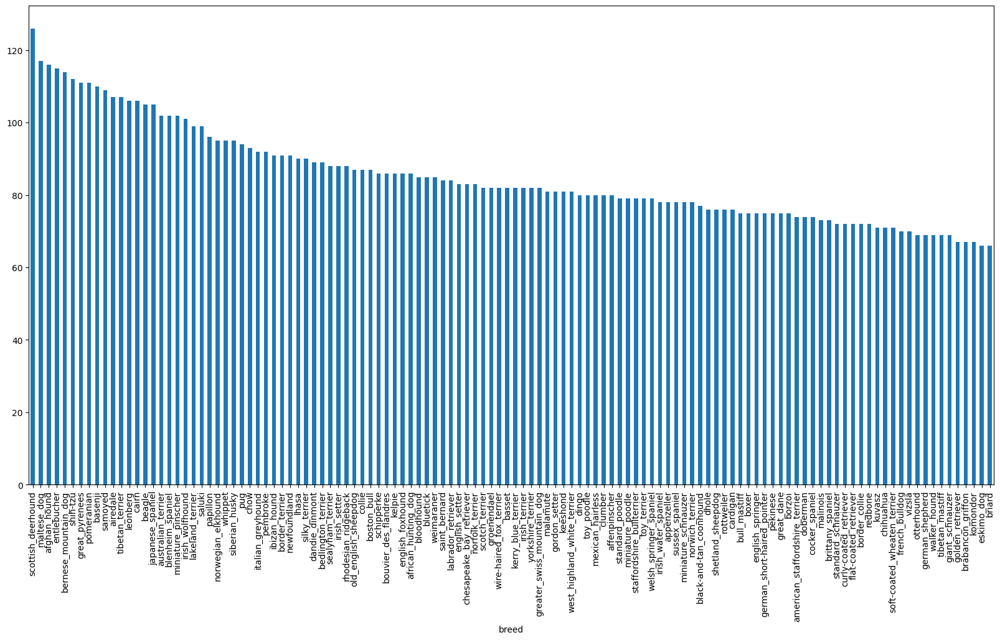

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

## Ways to View an image- Getting a list

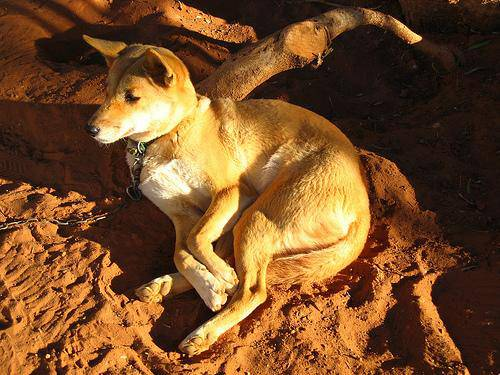

In [ ]:
# Let's view an image
from IPython.display import Image

Image("dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images in form of lists with their labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


### Checking Number of files in Filenames.

In [ ]:
# We are going to loop through these all and try to get a list of images (in form of above path)
filenames = ["dog-breed-identification/train/" + fname + ".jpg"
             for fname in labels_csv["id"]]

filenames[:5]

['dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

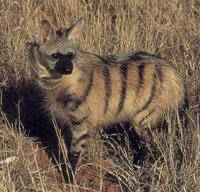

In [ ]:
# We can see all images in such way
Image(filenames[15])

In [ ]:
len(os.listdir("dog-breed-identification/train"))

10222

In [ ]:
# Check wether number of actual images = filenames numbers
# It's to ensure wether we are working on same number of images or not.

if len(os.listdir("dog-breed-identification/train")) == len(filenames):
  print("Number of files match")
else:
  print("Number of files don't match")

Number of files match


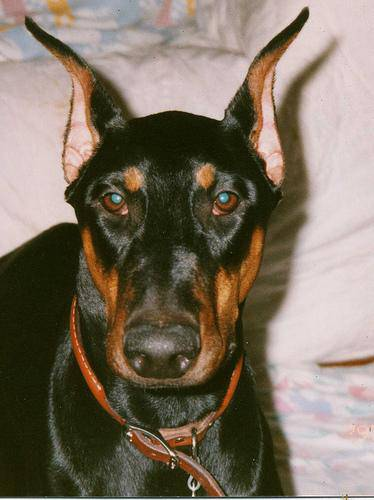

In [ ]:
# One more check
# Remember that labels are breed name we need to predict that
Image(filenames[9001])

In [ ]:
labels_csv["breed"][9001]

'doberman'

### Now we have training Image, Let's prepare for labels

Converting images into numbers
Steps
* Firstly convert in numpy array adn then check for missing labels
* secondly convert labels to numbers

In [ ]:
labels_csv["breed"]
# See that dtype is object we need it in numbers or numpy array.

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
# Checking for missing values
labels_csv["breed"].isna().sum()

labels = labels_csv["breed"].to_numpy()
labels

# Now we have array of strings where breed names are string type

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels) == len(filenames):
  print("Number of files match")
else:
  print("Number of files don't match")

# This is another name to check wether values are missing or not

Number of files match


In [ ]:
# Let's find unique labels values
# Getting unique values in a given array - np.unique is there

unique_breeds = np.unique(labels)
unique_breeds
len(unique_breeds)

# So there is only 120 dog breeds in this dataset

120

### To convert into numbers
convert into booleans first
* Each array will be compared with unique breeds values
* Wherever it matches it will return true either it will return false.

In [ ]:
# For example converting only one
print(labels[0])
labels[0] == unique_breeds

# This will return True only where boston bull is present that index will be true.

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Now doing this same thing for all the labels
# Getting 10000 boolean labels

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Turning Boolean labels into integers

In [ ]:
# Let's see an example
print(labels[0]) # Actual label(breed) name in string form
print(np.where(unique_breeds) == labels[0]) # This will give at which index lable occurs
print(boolean_labels[0].argmax()) # This will give at which index True value is there (index at which label present)
print(boolean_labels[0].astype(int)) # Converting into int

boston_bull
False
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# So in this way we need to convert each and every item of boolean labels

integer_labels = [boolean_labels[i].astype(int) for i in range(len(boolean_labels))]
integer_labels[:2]


[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0])]

# Creating Our Own Validation Set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels # Doing with the daniel, using boolean labels instead of integer labels

In [ ]:
len(X)

10222

## Note: We will experiment firstly with 1000 images and then we will increase as needed

* It's valid for all data Not only images

In [ ]:
# Set number of images used for experiment
# The slider is helpful tool of collab

NUM_IMAGES = 1000  #@param {type:"slider", min:1000, max:10000}

In [ ]:
# Lets's split out data into train and validation set
# May name suggests its train and test but we are splitting
# Into train and validation sets.

# We need only images which is set by NUM_IMAGES in both X and y.

from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

# Check the shape of your data before proceed!
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's check once again what's inside the data
X_train[:2], y_train[:2]


(['dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

# PreProcessing Images - Images to Tensors (Matrix)

Create functions whenever you are converting it into tensors

* To preprocess our images we will write functions
  * Take an image as filepath as input
  * Use TensorFlow to read the file and save it to a variable, `image`
  * Normalize our Image (take down to 0-1)
  * Resize the `image` to shape (224,224) means all images to be of same size
  * Return modified image


In [ ]:
tensor = tf.io.read_file(filenames[0])
tensor

# The long code which computer understand is a tensor.

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
# Let's make a function
# Image size 224 is very default.

IMG_SIZE = 224
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an Image file path and convert into tensors
  """

  # Read image file (in this way tensorflow will read our image)
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with RBG color channels
  image = tf.image.decode_jpeg(image, channels=3)


  # It's called normalisation process
  # Convert the color channel values from 0-255 to 0-1
  # Converting image data type to float ranging from 0 to 1.
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired size
  image = tf.image.resize(image, size=[img_size, img_size])

  return image


## Turning Data to Batches
A batch is a group of input data samples that are processed together during training.
Instead of feeding individual data points one by one, you group them into batches.

* 32 is (yann lecun) standard batch size for most of ml (check out tweet link )

* Jeremy haward and yann lecunn are some key figures

* It helps training images faster we will firstly work on 32 images.

* GPU has limited memories so use it wisely  so we need batches.

In order to use TennsorFLow effectively, we need our data in tensor tuples like this `(image, label)`

In [ ]:
# Create a imple function to return required tuples

def get_image_label(image_path, label):

  """
  Takes an image file path name and label and process the image
  """

  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of above function in which form we want
# An Image with its label but in form of tensorflow
# (process_image(X[42]), y[42]) # this will return simple label
(process_image(X[42]), tf.constant(y[42])) # this will return tensor label


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## Turning Images into different Batches

In [ ]:
# Turning images into batches of 32 (tuple of tensors mentioned in above form)
# Define the batch size, 32 is a good one

BATCH_SIZE = 32
# Create a function to turn data into batches
# Training, test and validation batches

def create_data_batches(X,
                        y=None,
                        batch_size=BATCH_SIZE,
                        valid_data=False,
                        test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs. Shuffles the data if
  if it's training data but doesn't shuffle if it's validation data. Also accepts
  test data as input (no labels).
  """

  # If the data is a test dataset, We haven't labels
  if test_data:
    print("Creating test data batches...")

    # It will take a tensor and create a data set by slicing that data.
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch

  # Now if the data is a vallid data set, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")

    # As it have labels too so we need to pass it too. as tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating Training data batches...")

    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))

    # Shuffle data and turn it into batches
    # Before mapping we will first shuffle
    # Because shuffling before will help to shuffle just filepaths but after process we need to
    # Shuffle full image, so shuffle first then map

    data_batch = data.shuffle(buffer_size=len(X)).map(get_image_label).batch(BATCH_SIZE)
    return data_batch


In [ ]:
len(X_val), len(y_val)

(200, 200)

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating Training data batches...
Creating validation data batches...


In [ ]:
len(val_data), len(train_data)

(7, 25)

In [ ]:
# Check out the attributes of our data batches
# .element_spec method is helpful to get details.
train_data.element_spec, val_data.element_spec

# tensorspec- shape(batchsize, image size, color channels), data type
# and it will return for both X (filepath or image), and label

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Our Data batches

Our data is now in batches, however we need to visualize it for easy understanding

* Before visualising the data we need to de-batchify the images/or data

In [ ]:
# Create a function for viewing images in a data match

def show_25_images(images, labels):
  """
  View 25 images from data batch on a single plot
  """

  # Setup the figure
  plt.figure(figsize=(15,12))

  # Loop through 25 (for displaying only 25 images)
  for i in range(25):
    # Create subplots of 5 rows by 5 cols
    ax = plt.subplot(5,5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the labels of image (ith label)
    # That's the required title only
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn off the gridlines
    plt.axis("off")

## De batching the images

In [ ]:
# What it will do is batch dataset will be converted into a numpy iterator
# It will take the batch and split it
# (None, 224, 224, 3) = train_image, (None, 120) - train_labels
# Next will take first batch and feed it to train_images values.

train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[4.04595613e-01, 4.24203455e-01, 4.35968161e-01],
          [4.20257002e-01, 4.39864844e-01, 4.51629549e-01],
          [3.96568656e-01, 4.16176498e-01, 4.27941203e-01],
          ...,
          [1.18137270e-01, 1.57599956e-01, 1.36929393e-01],
          [1.07059978e-01, 1.38174027e-01, 9.50003862e-02],
          [1.59411386e-01, 1.79199234e-01, 1.24848738e-01]],
 
         [[3.79693300e-01, 3.99301142e-01, 4.11065847e-01],
          [3.99387300e-01, 4.18995142e-01, 4.30759847e-01],
          [3.77328455e-01, 3.96936327e-01, 4.08701032e-01],
          ...,
          [6.04243279e-02, 1.02397375e-01, 8.08900148e-02],
          [6.54545873e-02, 1.00135960e-01, 5.57732098e-02],
          [1.12658933e-01, 1.37291282e-01, 8.29407945e-02]],
 
         [[3.82209361e-01, 4.01817203e-01, 4.13581908e-01],
          [4.06797677e-01, 4.26405519e-01, 4.38170224e-01],
          [3.92725617e-01, 4.12333459e-01, 4.24098164e-01],
          ...,
          [7.49827698e-02, 1.23161770e-01, 9.7129

In [ ]:
len(train_images), len(train_labels)

(32, 32)

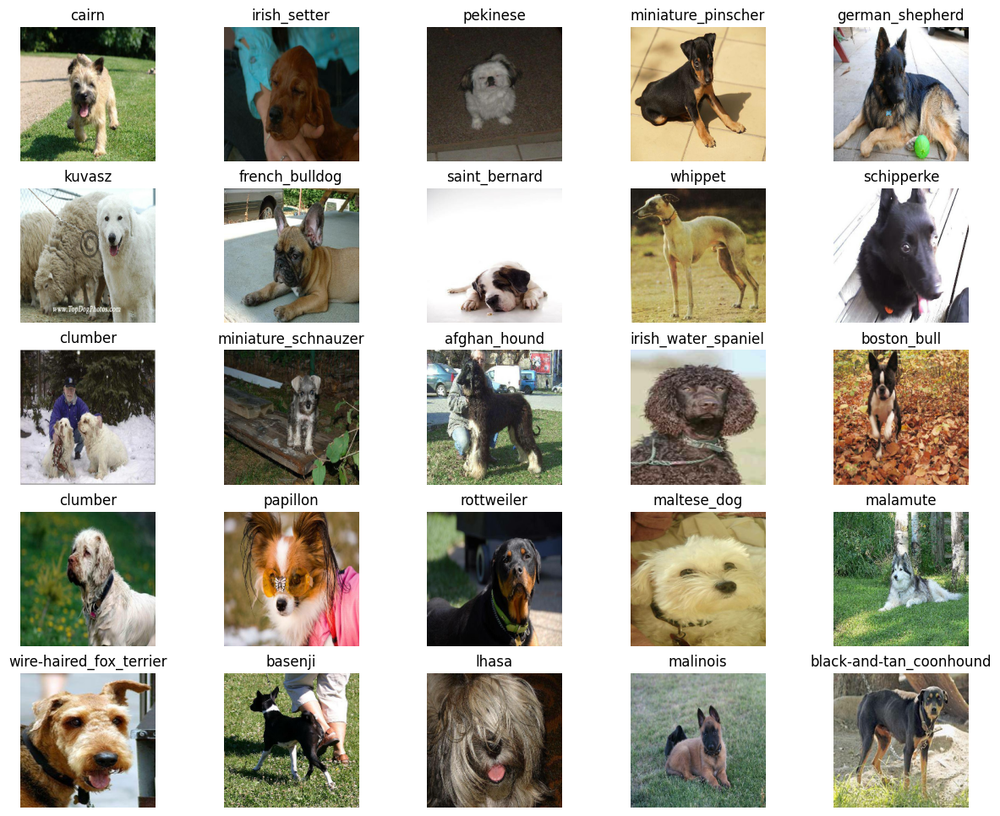

In [ ]:
# Now Visualize the data in a training batch
# As we run it will select next batch one by one (that's working of next)
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# These 25 images are in one training batch

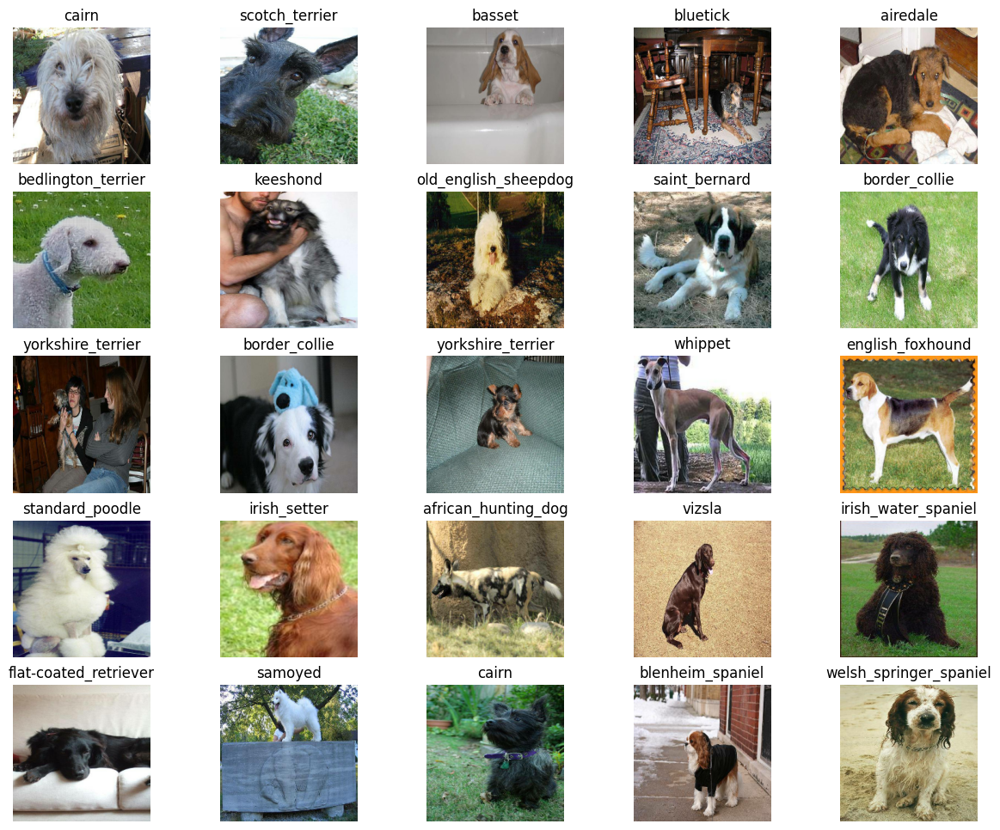

In [ ]:
# Now let's visualize for validataion set
# Training batch will only always be shuffled because we don't want to remember the model.
# So validation batch will not be shuffled
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a Deep Learning Model

Before we build a model, Need to keep things in minds-

* The input shape (our images shape, must be in form of tensors)

* The output shape(Image Labels, in the form of tensors) of our model

* The URL of the model we want to use

* This URL will help us to reuse the model- Transfer learning

* Some websites are - TensorFlow Hub, Model zoo, Pytorch hub, papers with code (latest reasearch papers)

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
# FORM OF batch, height of image, width of image, color channel
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Output shape of our model
# It will return 120 unique breeds- means its equal to length of unique labels.
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"


## Creating a function with help of Keras-

* Takes input shape, output shape, model as parameters

* Defines the layers in a keras model in a sequential fashion (do this first, then go on second layer)

* Builds the model (tells the model the input shape it'll be getting)

* Finally Returns the modified model.

You can read more on available link-
https://www.tensorflow.org/guide/keras


In [ ]:
# Create a function which builds a keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,
                 model_url=MODEL_URL):
  """
  Takes a TensorFlow Hub URL and creates a Keras Sequential model with it.
  """
  print("Building model with:", MODEL_URL)

  # setup the model layers
  # Keras layer is the first layer
  # Dense helps us to modify the output shape
  # Softmax means output for all 120 breeds will be between 0 and 1
  # Its same like probability.
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(OUTPUT_SHAPE,
                            activation="softmax") # Layer-2 Output layer
                               ])

  # Compile the model
  # Loss function means how our model predicting the labels(how much correct)
  # Optimizer function helps in minimising loss function - to came it nearly 0
  model.compile(
      loss="categorical_crossentropy",
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  # Return the model
  return model


In [ ]:
model = create_model()
model.summary()

# Trainable Params: It means these params need to be learnt by model(new)
# Non Trainable params: These parameters are already learnt by model

# This is the power of transfer learning that we can use existing power


Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating Callbacks for Models

Call backs are helper functions that a model can use during training like-

* Save its progress
* Stop its training
* Check its progress etc.

Because there are some models which takes weeks for training so we need to track the progress

We need to stop it to avoid overfitting.

* Tensorboard callbacks- Track our model progress

* Early Stopping which prevents model from overfitting
* If model is not imporoving but just training we need to stop it

## TensorBoard Call Back

To set up this, we need to do following

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit` function.

3. Visualize our models training logs with the `%tensorboard` magic function (We'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Make a function to build tensorboard callback
# we need to pass log files directory
import datetime

def create_tensorboard_callback():
  """
  Creates a TensorBoard callback to store log files.
  """
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                      #  Make a log file with the current date and time.
                      )

  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping callback

Stop Training when a certain evaluation quantity stops improving
<br>
If a model trains too well, It will overfit but doesn't able to find the patterns on any other dataset.

<br>

It like mugging up everything, but doesn't understand anything, so it can't perform well on unseen question
<br>
Number of Epochs means a complete pass to the training- means one complete training of model where it finds pattern and ev

In [ ]:
# Creat early stopping callback
# Validation accuracy is monitored here.
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                        patience=3)

# Training The Model- Finally Ready.

Its on only 1000 images - First model.

To make sure that everything is working correct.

In [ ]:
# How many passes we need to perform by our model
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [ ]:
print("GPU", "AVAILABLE" if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE")

GPU AVAILABLE


## Let's creat a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing training data then validation data, num of epochs

* Return the model

In [ ]:
# Build a function to train and return trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create a TensorBoard callback (everytime we need to track)
  tensorboard = create_tensorboard_callback()

  # Fit the model to data passing it the callback that we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

When training the model first time
First epoch will take more time
More data more time as it will load it into the memory

In [ ]:
# Fit the model to the data
model = train_model()
# 800 images/32 batch size = 25 steps

# Once validation accuracy is not improving it will stop that's what happened

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 12s 124ms/step - loss: 4.6410 - accuracy: 0.0975 - val_loss: 3.4050 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 2s 74ms/step - loss: 1.6473 - accuracy: 0.6762 - val_loss: 2.0901 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 2s 97ms/step - loss: 0.5703 - accuracy: 0.9375 - val_loss: 1.6348 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 2s 67ms/step - loss: 0.2574 - accuracy: 0.9900 - val_loss: 1.4532 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 2s 75ms/step - loss: 0.1485 - accuracy: 0.9962 - val_loss: 1.3569 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 2s 79ms/step - loss: 0.1022 - accuracy: 0.9987 - val_loss: 1.3091 - val_accuracy: 0.6600
Epoch 7/100
25/25 [===================

**question:** It seems that our model is overfitting -
How You can know this
You can compare the val_loss and loss and both accuracies

### Conclusion from above model

* So here my model is not overfitting (because i have done wrong splitting - `20240630-133755/train` )
* I have correct it in second go and get correct results
* But Overfitting in begin is a good thing
* Overfitting means its doing very well on training dataset but not doing very well on validation set.

## Checking The TensorBoard Logs

It's helpful when you have multiple models, It will access logs directory and visualize it's contents.

** Here we see the comparison between the both quantities, Easily we can see its overfitting or not**

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Making and Evaluating Predictions using Trained Model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
len(val_data)

7

In [ ]:
# Make predictions on validation data (not used for training - 200 images)
# It will see images and predict the labels and then we will compare it with true labels
predictions = model.predict(val_data,
                            verbose=1)
predictions

7/7 [==============================] - 4s 103ms/step


array([[5.02596900e-04, 1.63036268e-04, 1.88993651e-03, ...,
        1.46828796e-04, 2.22367325e-05, 2.18518102e-03],
       [1.09544955e-03, 3.61674931e-04, 1.94567852e-02, ...,
        3.63396690e-03, 3.91030975e-04, 4.32705347e-05],
       [2.34855252e-05, 2.32953153e-05, 7.78162212e-05, ...,
        2.61237274e-05, 1.86656456e-04, 1.28962871e-04],
       ...,
       [1.15967605e-05, 2.08862966e-05, 7.76271772e-05, ...,
        4.41052134e-06, 7.64712095e-05, 2.17573288e-05],
       [1.28575470e-02, 5.11548365e-04, 6.13392695e-05, ...,
        4.35594266e-04, 5.69198819e-05, 1.35610187e-02],
       [1.57889968e-04, 1.05890955e-04, 1.08758570e-03, ...,
        3.60656966e-04, 6.78133947e-05, 1.26065745e-04]], dtype=float32)

In [ ]:
predictions.shape

# For 200 images for each we have 120 predictions
# For each image we have 120 predictions i.e probability of getting each breed.

(200, 120)

In [ ]:
predictions[0]
# These are associated probabilities for all 120 breeds
# The highest value will be the predicted label.

array([5.0259690e-04, 1.6303627e-04, 1.8899365e-03, 2.2448614e-05,
       3.5066213e-04, 5.3818872e-05, 2.1602031e-02, 3.4365087e-04,
       1.9983754e-05, 9.2771894e-05, 1.3817857e-04, 1.2361024e-04,
       4.3530643e-04, 1.8779089e-04, 5.9920910e-04, 4.5299230e-04,
       7.2810755e-05, 3.0306369e-01, 7.7504199e-05, 1.6720014e-05,
       1.8074887e-03, 3.4738996e-04, 6.8608788e-06, 1.2694002e-03,
       1.1898277e-04, 2.3553321e-04, 8.0393158e-02, 9.2931019e-05,
       8.9651940e-04, 5.6248181e-04, 2.7447390e-05, 1.5067593e-03,
       6.2509865e-04, 7.9619203e-05, 1.1502851e-04, 3.8967606e-02,
       3.6992238e-05, 1.5169103e-04, 6.5311593e-05, 1.5684374e-04,
       1.2011152e-03, 3.0114084e-05, 9.6547112e-05, 1.1412062e-04,
       2.7006758e-05, 8.3689811e-05, 5.4367134e-05, 1.0585460e-03,
       5.5862108e-04, 3.8306692e-04, 1.9546707e-05, 1.7040002e-05,
       7.4745086e-04, 4.2209413e-05, 5.8613624e-04, 7.5949524e-06,
       1.7028916e-04, 4.5220070e-03, 3.1136794e-04, 1.9151414e

In [ ]:
np.sum(predictions[0])
# It's close to 1 because computer stores the number differently.

1.0

In [ ]:
len(y_val)

200

In [ ]:
# let's Find what Our model predicts actually by taking maximum of these 120
# Some Example predictions - we will write functions
index = 14

print(predictions[index])
print(f"Max Value (Probability of prediction): {np.max(predictions[index])}")
print(f"Max value at which index in predictions: {np.argmax(predictions[index])}")
print(f"sum of all values: {np.sum(predictions[index])}")
print(f'Actual label: {y_val[index]}')
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[7.20444717e-04 2.26082964e-04 5.15055144e-04 4.19339107e-04
 3.43725737e-03 1.38584292e-04 9.14164644e-04 1.07973218e-02
 2.95299646e-02 9.69154611e-02 3.26015543e-05 2.53864971e-04
 1.76001911e-03 4.97108279e-03 3.26852663e-04 2.57593510e-03
 2.03462259e-04 2.19733478e-03 2.92802550e-04 1.24042144e-03
 6.25487475e-04 3.36311525e-03 9.06597357e-04 6.39354228e-04
 2.65081078e-02 4.81987314e-04 5.01019022e-05 3.03179986e-04
 7.17361167e-04 5.27689845e-05 1.80251627e-05 5.03707211e-04
 2.80350359e-04 3.93708237e-03 2.13391701e-04 1.04628372e-04
 3.37610079e-04 1.33725593e-03 1.04311644e-03 6.03146791e-01
 8.25151452e-04 1.45625381e-04 9.26954299e-03 7.85542070e-05
 1.71906804e-03 1.21681987e-04 6.38278609e-04 3.12453811e-03
 5.56151615e-04 1.90360166e-04 6.77633070e-05 1.28377543e-03
 1.45772661e-04 7.63182528e-04 1.14107497e-04 7.25640450e-03
 2.82524386e-04 1.35783933e-03 2.13768217e-04 3.58442085e-05
 8.33171594e-04 9.57720634e-03 1.07065243e-04 2.73327023e-04
 6.64434920e-04 2.368338

## Creating a Functions To Compare Model Predictions

Note: Having the above functionality is great but we want to scale it
<br>
It could be better if we can see images which is predicted

**Note:** Prediction Probabilities also known as Confidence levels

In [ ]:
# Turn these prediction probabilities into there respective label
def get_pred_labels(prediction_probabilities):
  """
  Turns an array of prediction probabilities into an array of predicted labels.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of predictions probabilities
pred_label= get_pred_labels(predictions[81])
pred_label


'dingo'

### Unbatch the Val_data - To compare

For comparison of actual labels and predicted labels we need to unbatch the val_data

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch data
# Functions are good because you will not get confused between variables
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) pairs and returns separate arrays
  for images and labels.
  """

  images, labels = [], []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
# Unbatchify the validations data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Create a function to unbatch a bathced dataset
# Actually there is a built in function for it prefer- unbatch
# First non function-way

images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]
# Our Goal is to visulaize this image and compare it with label

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
print(get_pred_labels(val_images[0]))
print(get_pred_labels(val_labels[0]))

vizsla
affenpinscher


# Visualizing The Models Predictions

Now we've -
* Predictions Labels
* Validation Labels (Actual True labels)
* Validation Images

Let's make some function to plot these at one plot

We'll Create a function which:
* Takes an array of prediction Probabilities, an array of truth labels and an array of iamges and integers

* Convert the preictions probabilities to a predicted label.
* Plot the predicted label, its predicted probability(Max value), the truth label and the target image

In [ ]:
def plot_pred(prediction_probabilities, label, images, n=1):
  """
  Plots an image with a predicter function, ground truth label and truth image
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_labels(pred_prob)

  # Plot image and remove x and y ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Color of the title if prediction is correct or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)




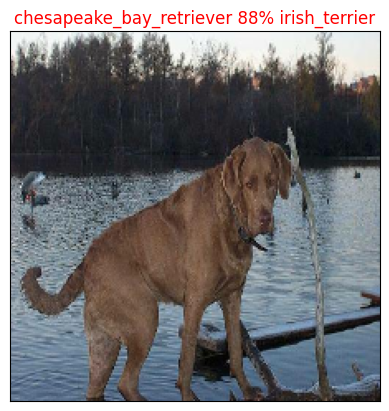

In [ ]:
plot_pred(prediction_probabilities=predictions,
          label=val_labels,
          images=val_images,
          n=58)


# There is some issue with the function here
# Because it's working fine when visualising 10 prob at once
# Need to recheck leaving right now

## Visualizing top 10 Confidence levels

Now we've Got one function to visualize our models predictions, we want to see our model's first 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find prediction using get_pred_label()

* Find the Top 10
  * Prediction probabilities indexes
  * Prediction Probabilities values
  * Prediction labels

* Plot the top 10 Prediction probability values and labels coloring true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 prediction probabilities and labels.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_labels(pred_prob)

  # Find the top 10 prediction confidence indexes (top 10 probabilities index value)
  # Sorted in ascending order (by default) (arg will give indices)[::-1] is for reversing
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_index]

  # Find the top 10 prediction labels (these are predicted by our model)
  top_10_pred_labels = unique_breeds[top_10_pred_index]

  # Setup a plot
  # (x,y, color)
  # we need 10 bars hence np.arange is used
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    # Get the top_plot[wherever the values are equal take that index and set color green]


In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 17, 103,  65,  26,  35,   6,  59, 106,  73, 109])

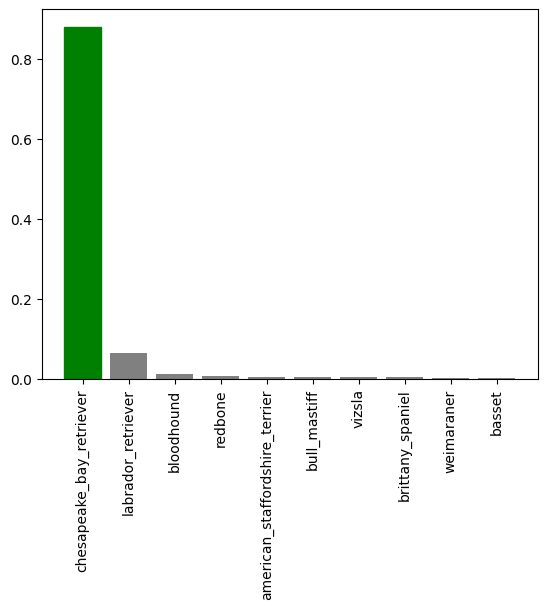

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=58)

# Whichever color is in green it's true.
# What's happening is it's predicted for 58th out of 200 images
# I am showing top 10 breeds that our model tried to guess and
# You can see not always our model able to find correct one with max probability


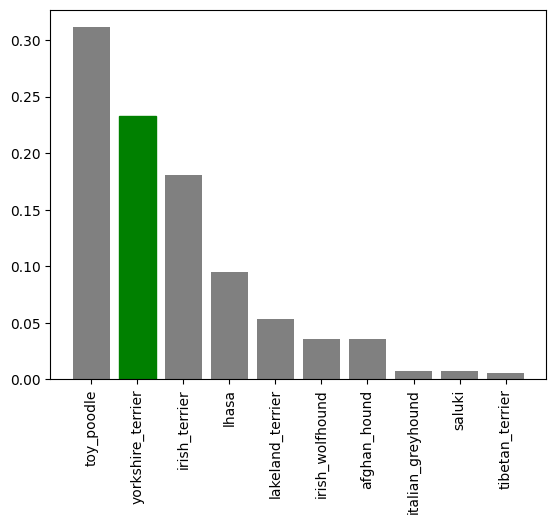

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=10)

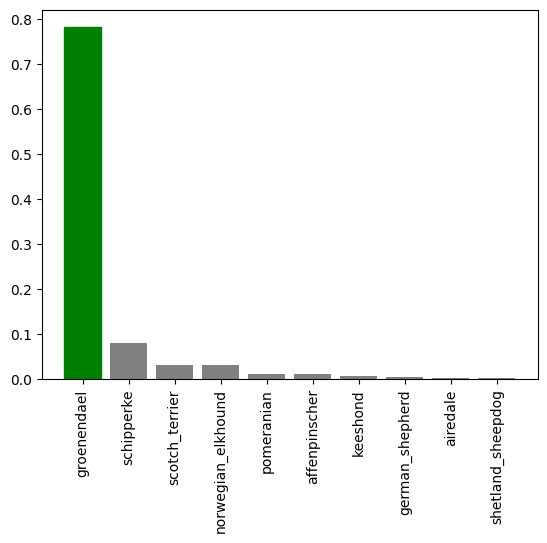

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=77)

Now we've functions to evaluate and visualize predictions

Check out a few predictions and their different values

<function matplotlib.pyplot.show(close=None, block=None)>

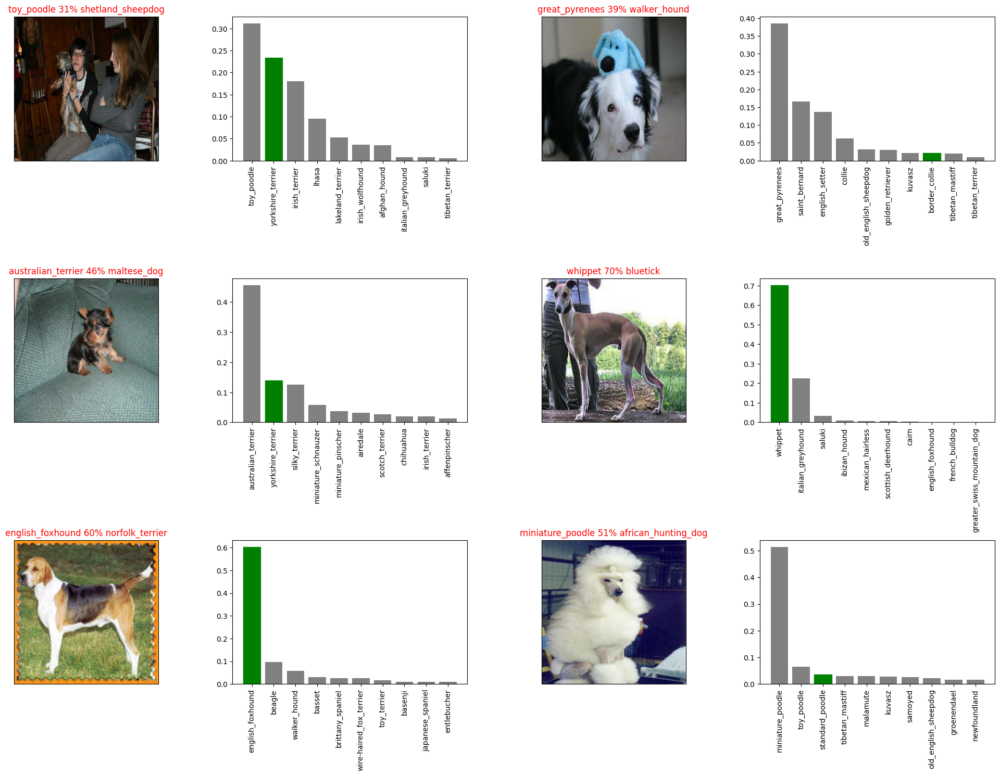

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            label=val_labels,
            images=val_images,
            n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout()
plt.show

# There is some problem with labels data need to check - val_labels

**Challenge:** How would You create a confusion matrix with our models predictions and true labels

# Saving The Trained model

It's important to save our progress otherwise we need to retrain the model

In [ ]:
# Create a functio to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a format compatible with Kaggle submission format.
  """
  # Create a directory to save model
  model_dir = os.path.join("Models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  # .h5 is the format of the model.
  model_path = model_dir + "-" + suffix + ".h5"

  print(f"Saving model to: {model_path}...")
  model.save(model_path)

  return model_path


In [ ]:
# Create a function to load a model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """

  print(f"Loading saved model from: {model_path}")

  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})

  return model


In [ ]:
# Let's test both functions
# save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilentv2-Adam")


Saving model to: Models/20240702-113205-1000-images-mobilentv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'Models/20240702-113205-1000-images-mobilentv2-Adam.h5'

In [ ]:
# Let's load the model
# Just give the input of model path
loaded_1000_images_model = load_model("Models/20240702-113205-1000-images-mobilentv2-Adam.h5")

Loading saved model from: Models/20240702-113205-1000-images-mobilentv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2007 - accuracy: 0.6850


[1.2007206678390503, 0.6850000023841858]

In [ ]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 61ms/step - loss: 1.2007 - accuracy: 0.6850


[1.2007206678390503, 0.6850000023841858]

# Training The model on 10k Images- Full Dataset

Now it's time to train the model on full dataset as now everything is fine.

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train), len(y_train)

(800, 800)

In [ ]:
# We need to convert all images to tensors
# Then we need to convert into batches

full_data= create_data_batches(X, y)
# This function will convert images into tensors and convert data into batches.

Creating Training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
len(full_data)

320

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


## Create full model callbacks

Again while training make some callbacks

In [ ]:
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)


**Note:** Running first epoch of following data will be taking long may be 30 mins.

In [ ]:
# Fit the full model to the full data (will take 30 mins)
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 23s 58ms/step - loss: 1.3460 - accuracy: 0.6689
Epoch 2/100
320/320 [==============================] - 19s 58ms/step - loss: 0.4051 - accuracy: 0.8805
Epoch 3/100
320/320 [==============================] - 17s 55ms/step - loss: 0.2381 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 17s 54ms/step - loss: 0.1541 - accuracy: 0.9624
Epoch 5/100
320/320 [==============================] - 19s 58ms/step - loss: 0.1066 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0779 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 19s 60ms/step - loss: 0.0595 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0458 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 24s 75ms/step - loss: 0.0362 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 17s 54ms/step - l

In [ ]:
# I have downloaded the model now i can load that model and use it
# No need to train again
save_model(full_model, suffix="10k-images-mobilentv2-Adam")

Saving model to: Models/20240702-115637-10k-images-mobilentv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'Models/20240702-115637-10k-images-mobilentv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("Models/20240702-115637-10k-images-mobilentv2-Adam.h5")

Loading saved model from: Models/20240702-115637-10k-images-mobilentv2-Adam.h5


# Making Prediction on the Test Dataset- Using Full Data Model

Before using the test data, we need to convert these images into exact datatype on which our model trained

Hence to make prediction, we need to convert it into data_batches(we have function for that)

Steps to follow:
* Get the test image filenames
* Convert the filenames into test data batches using `create data bathces()` and setting `test_data` true as there no labels

* Finally make a prediction array by passing test batches to the `predict()` method called on full model

In [ ]:
# Loading the test images
# jpg is already added in file name
test_path = "dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]


In [ ]:
len(test_filenames)

10357

In [ ]:
# Let's create the test data batch
test_data = create_data_batches(test_filenames, test_data=True)

test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
len(test_data)

324

**Note:** It will also take more time as this time we are testing another 10k images.

In [ ]:
# Let's make a prediction array using test data with our full model

test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 48s 150ms/step


In [ ]:
test_predictions[:10]

array([[2.1379885e-10, 6.2944777e-10, 5.6462333e-09, ..., 2.4128698e-05,
        2.2563555e-08, 7.6482681e-11],
       [4.5249081e-07, 1.6889691e-08, 8.5804928e-08, ..., 3.4909692e-04,
        3.7399287e-04, 1.2097699e-05],
       [3.3831909e-10, 2.1783610e-10, 1.3899166e-13, ..., 4.1159410e-15,
        3.1873257e-10, 3.3029368e-09],
       ...,
       [5.4588282e-01, 1.0348542e-07, 2.0210350e-06, ..., 7.0589090e-10,
        1.1014926e-07, 1.3408758e-04],
       [9.5373341e-11, 4.7964320e-11, 9.1695158e-11, ..., 2.6415597e-08,
        4.0199102e-05, 2.0555367e-10],
       [3.0496882e-04, 8.0202393e-05, 5.2022617e-09, ..., 4.3946031e-05,
        1.5146991e-08, 7.8101493e-06]], dtype=float32)

## Downloading in a csv format of Test Predictions

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("test_predictions.csv",
           test_predictions,
           delimiter=","
           )

In [ ]:
# Give the path and delimiter
test_predictions_csv = np.loadtxt("/content/test_predictions.csv",
                                  delimiter=",")

In [ ]:
test_predictions_csv[:10]

array([[2.13798854e-10, 6.29447772e-10, 5.64623326e-09, ...,
        2.41286980e-05, 2.25635546e-08, 7.64826813e-11],
       [4.52490809e-07, 1.68896914e-08, 8.58049276e-08, ...,
        3.49096925e-04, 3.73992865e-04, 1.20976993e-05],
       [3.38319095e-10, 2.17836096e-10, 1.38991656e-13, ...,
        4.11594104e-15, 3.18732568e-10, 3.30293681e-09],
       ...,
       [5.45882821e-01, 1.03485419e-07, 2.02103502e-06, ...,
        7.05890901e-10, 1.10149259e-07, 1.34087575e-04],
       [9.53733412e-11, 4.79643200e-11, 9.16951584e-11, ...,
        2.64155968e-08, 4.01991019e-05, 2.05553671e-10],
       [3.04968824e-04, 8.02023933e-05, 5.20226173e-09, ...,
        4.39460309e-05, 1.51469912e-08, 7.81014933e-06]])

In [ ]:
# Each have the 120 predictions
# We have to title each of the dog breed (above their probabilities) with id as the filename
test_predictions_csv.shape

(10357, 120)

## Making Kaggle submission format

* To get the data into that format
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths

* Add Prediction Probabilities to each of dog breed

* Export the Dataframe as a CSV to submit it to Kaggle.

In [ ]:
# These are our columns titles
 ["id"] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Preparing the test submission format
# Let's make a dataframe like this

preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
os.path.splitext(test_path)

('dog-breed-identification/test/', '')

In [ ]:
# Let's add the data to the cols
# Append test images filenames only to preds_df id columns
test_ids = [os.path.splitext(fname)[0] for fname in os.listdir(test_path)]

preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,94a681f65f37fb3666c07b89d4d7a071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f5c14e0368f4e364a32d873f7e0aff13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8ef652e3a8e720c288bdd74b20f32070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1fbb419ca6796def6b25e0ef0af4af81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,803d7415c42d682a9eff453115163fa1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Now let's append prediction probabilities
preds_df[list(unique_breeds)] = test_predictions_csv
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,94a681f65f37fb3666c07b89d4d7a071,2.137989e-10,6.294478e-10,5.646233e-09,3.729414e-09,9.323771e-03,3.065812e-06,3.654612e-11,2.167327e-08,1.662477e-07,...,1.142002e-09,1.531948e-08,5.767161e-08,7.660918e-04,3.913879e-05,5.522355e-09,2.933052e-07,2.412870e-05,2.256355e-08,7.648268e-11
1,f5c14e0368f4e364a32d873f7e0aff13,4.524908e-07,1.688969e-08,8.580493e-08,2.708944e-08,7.480300e-03,1.570878e-06,1.876854e-07,1.763776e-01,1.990053e-05,...,9.502890e-05,1.563401e-02,7.199341e-08,1.269495e-02,1.200222e-05,1.086133e-06,1.286806e-03,3.490969e-04,3.739929e-04,1.209770e-05
2,8ef652e3a8e720c288bdd74b20f32070,3.383191e-10,2.178361e-10,1.389917e-13,2.119295e-11,6.630817e-14,2.660128e-12,5.378571e-11,2.429222e-12,4.380986e-08,...,3.534148e-11,2.649927e-13,1.773800e-11,4.716264e-09,1.969227e-11,1.162246e-07,1.660537e-11,4.115941e-15,3.187326e-10,3.302937e-09
3,1fbb419ca6796def6b25e0ef0af4af81,5.941351e-06,1.491564e-09,3.184976e-09,9.352806e-14,6.789389e-05,1.132298e-02,1.142471e-09,2.720349e-04,6.433062e-05,...,3.478045e-10,5.269414e-03,1.609436e-07,6.525472e-08,1.489604e-05,7.926389e-05,3.889954e-06,9.174382e-01,1.285527e-07,1.122934e-09
4,803d7415c42d682a9eff453115163fa1,1.445685e-01,5.648899e-09,3.345719e-09,1.687986e-06,9.496576e-08,7.949971e-08,5.766793e-11,4.566935e-10,6.222069e-12,...,3.700650e-06,1.373117e-07,2.095514e-10,4.754113e-08,1.161423e-11,7.954085e-11,1.584274e-11,1.294191e-08,2.934693e-09,1.465023e-08


In [ ]:
# Let's export pd df to csv, this is csv format
preds_df.to_csv("full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)